# Data Mining Project
### Jiyoung Kim - Student ID 110075
### Anastasia Karuzina - Student ID 85536

**Target variable:** CHURN RATE

**Hypothesis 1:** Customers who pay for the service more money than on average has higher chance to stop using the service.

**Hypothesis 2:** Annual term contract customer has less channce to leave than monthly term contract customer.

**Hypothesis 3:** If a customer uses additional services of Telecom, she will not stop using the service.


**Hypothesis 4:** Internet service can affect the churn rate.

## **Step 1. Sample**

In [1]:
# Import packages
import pandas as pd
import numpy as np
#import sklearn import preprocessing

## For Visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from pandas.plotting import scatter_matrix
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder, LabelBinarizer
from sklearn_pandas import DataFrameMapper, cross_val_score
import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline

# Set font size for plotting
sns.set(font_scale=1)

In [3]:
# Load dataset
telco_org = pd.read_csv("/content/WA_Fn-UseC_-Telco-Customer-Churn.csv", na_values=' ') 
# to prevent values with blank space being considered as value
telco_org.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [4]:
# Drop the Customer ID column since we will not use
telco = telco_org.drop('customerID', axis=1)

In [5]:
telco_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [6]:
# missing value check 
telco.isnull().sum() # 11 missing values in TotalCharges

gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [7]:
telco.dropna(inplace=True)
telco.reset_index(drop=True, inplace=True)

In [8]:
telco.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   int64  
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-null   object 
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   object 
 16  PaymentMethod     7032 non-null   object 


In here, we can actually see a variables with wrong data type. 
*   SeniorCitizen should be an object (categorical variable)



In [9]:
# Data type revision
telco["SeniorCitizen"] = telco["SeniorCitizen"].astype(str)
telco.dtypes

gender               object
SeniorCitizen        object
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

In [10]:
# continuous variables statistics
telco.describe() 

,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


In [11]:
# let's keep original dataset done with basic preprocessing
telco_copy = telco.copy()

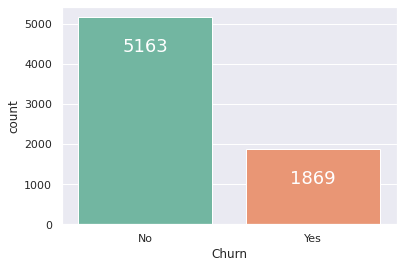

In [12]:
# Plot - target var: Churn
churn_bar = sns.countplot(data=telco_copy, x="Churn", palette="Set2")
for p in churn_bar.patches:
    churn_bar.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

plt.show()

####**Conversion of Categorical variables (non-numeric inputs)**

**(Create Dummy columns & Text columns to Integers)**

1) Variables with 2 level YES/NO → 1/0

2) Variables with 3 levels YES/NO/No Internet Service (in this case, we will regard it as NO) → 1/0

3) Variables with several levels → create dummy columns

In [13]:
telco.gender = [1 if each == "Male" else 0 for each in telco.gender]
telco.SeniorCitizen = [1 if each == "1" else 0 for each in telco.SeniorCitizen]

columns_to_change1 = ['OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
                       'TechSupport', 'StreamingTV', 'StreamingMovies']
        
for column in columns_to_change1:
   telco[column] = telco[column].replace({'No internet service':'No'})

columns_to_change2 = ['Partner','Dependents','PhoneService','OnlineSecurity',
                      'OnlineBackup','DeviceProtection','TechSupport',
                      'StreamingTV','StreamingMovies','PaperlessBilling','Churn']

for column in columns_to_change2:
    telco[column] = telco[column].map({'Yes':1, 'No':0})

dummy_col = ['MultipleLines', 'InternetService', 'Contract', 'PaymentMethod']
telco_new = pd.get_dummies(data=telco, columns = dummy_col)
telco_new.head()
    
telco.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,No phone service,DSL,0,1,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,0,0,0,34,1,No,DSL,1,0,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0
2,1,0,0,0,2,1,No,DSL,1,1,0,0,0,0,Month-to-month,1,Mailed check,53.85,108.15,1
3,1,0,0,0,45,0,No phone service,DSL,1,0,1,1,0,0,One year,0,Bank transfer (automatic),42.30,1840.75,0
4,0,0,0,0,2,1,No,Fiber optic,0,0,0,0,0,0,Month-to-month,1,Electronic check,70.70,151.65,1


In [14]:
# We still have some categorical(factor) variables are left such as InternetService, Contract, PaymentMethod.
# For these variables, we will create dummy columns.

dummy_col = ['MultipleLines', 'InternetService', 'Contract', 'PaymentMethod']
telco_new = pd.get_dummies(data=telco, columns = dummy_col)
telco_new.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,MultipleLines_No,MultipleLines_No phone service,MultipleLines_Yes,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,0,1,0,0,0,0,1,29.85,29.85,0,0,1,0,1,0,0,1,0,0,0,0,1,0
1,1,0,0,0,34,1,1,0,1,0,0,0,0,56.95,1889.50,0,1,0,0,1,0,0,0,1,0,0,0,0,1
2,1,0,0,0,2,1,1,1,0,0,0,0,1,53.85,108.15,1,1,0,0,1,0,0,1,0,0,0,0,0,1
3,1,0,0,0,45,0,1,0,1,1,0,0,0,42.30,1840.75,0,0,1,0,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0,2,1,0,0,0,0,0,0,1,70.70,151.65,1,1,0,0,0,1,0,1,0,0,0,0,1,0


In [15]:
telco_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   gender                                   7032 non-null   int64  
 1   SeniorCitizen                            7032 non-null   int64  
 2   Partner                                  7032 non-null   int64  
 3   Dependents                               7032 non-null   int64  
 4   tenure                                   7032 non-null   int64  
 5   PhoneService                             7032 non-null   int64  
 6   OnlineSecurity                           7032 non-null   int64  
 7   OnlineBackup                             7032 non-null   int64  
 8   DeviceProtection                         7032 non-null   int64  
 9   TechSupport                              7032 non-null   int64  
 10  StreamingTV                              7032 no

#### **Data Partitioning**

In [16]:
# 1) Data Partitioning (70/30) - In default way of using sklearn (X-only independent variables, y-our target variables)
# Since our dataset is relatively small, we didn't split it into 3 sets (train, validation, test)

from sklearn.model_selection import train_test_split

X = telco_new.drop('Churn', axis=1) 
y = telco_new['Churn']

# Train - Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y, random_state = 42)

X_train_shape = X_train.shape
X_test_shape = X_test.shape
print("X_train shape = {}\nX_test shape = {}".format(X_train_shape, X_test_shape))

X_train shape = (4922, 28)
X_test shape = (2110, 28)


## **Step 2. Explore**

### **EDA (Multiplot in SAS Miner)**

Through this basic EDA part, we will check all variables' distribution and proportion of Churn(yes or no) in each of them. (we can also consider this EDA results when we decide how to deal with highly correlated variables(variables with multicollinearity) in our next step. 

**Numeric Variables**

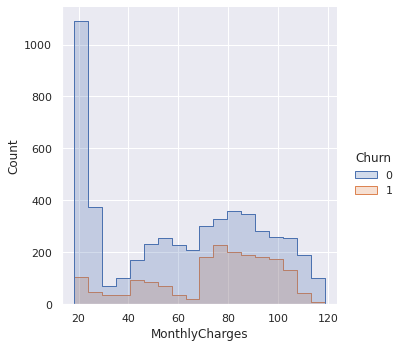

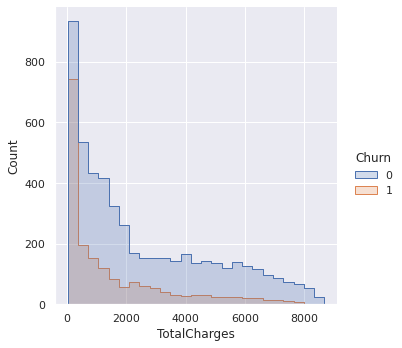

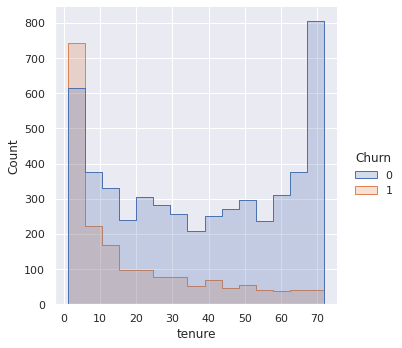

In [17]:
sns.displot(telco, x='MonthlyCharges', hue='Churn', element='step')
sns.displot(telco, x='TotalCharges', hue='Churn', element='step')
sns.displot(telco, x='tenure', hue='Churn', element='step')

**Categorical Variables**

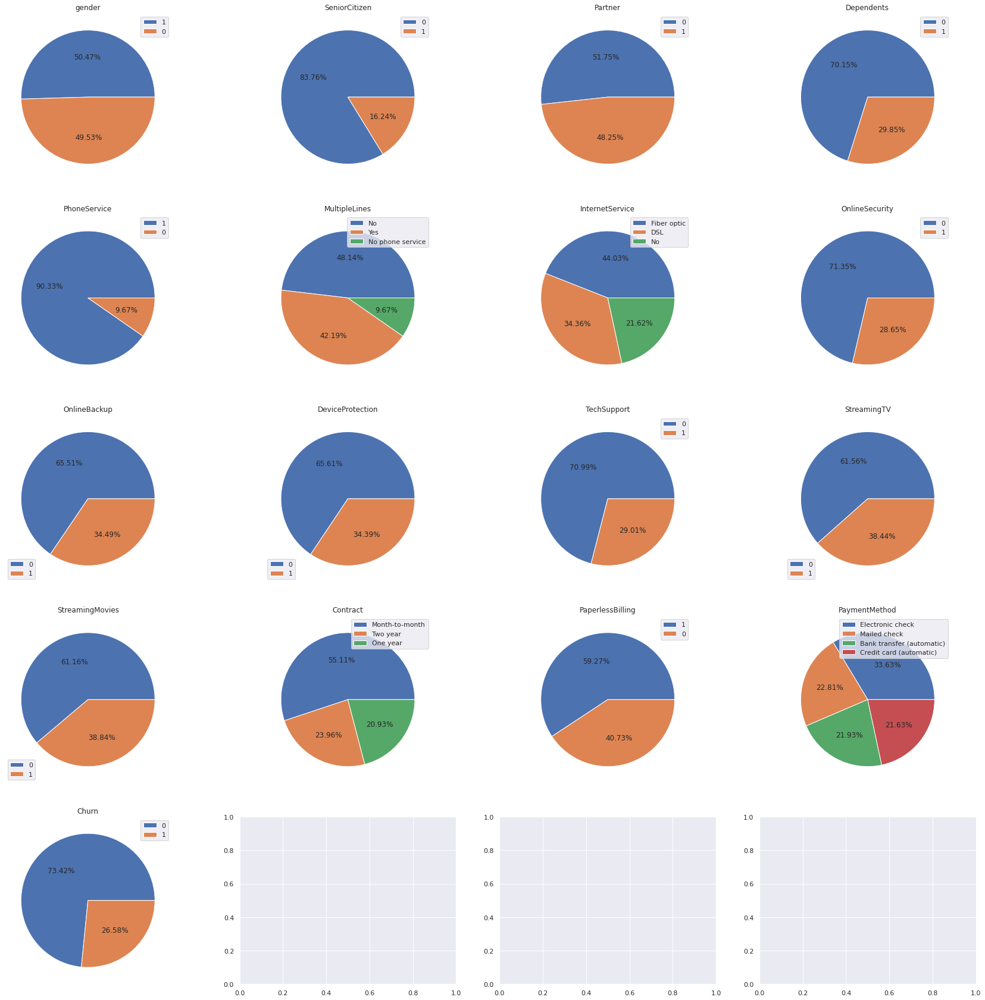

In [18]:
# Plot - How does distribution of all variables look like in overall
import math

columns = telco.columns.tolist()
num_var = ['tenure','MonthlyCharges','TotalCharges'] # exempt the numerical variables
for i in num_var:
    columns.remove(i)
    
f, axes = plt.subplots(math.ceil(len(columns)/4),4, figsize=(30,30))
for col, ax in zip(columns, axes.ravel()):
        data = telco[col].value_counts().values.tolist()
        labels = telco[col].value_counts().index.tolist()
        ax.pie(data,autopct='%0.2f%%')
        ax.set_title(col)
        ax.legend(labels,loc='best')

IndexError: ignored

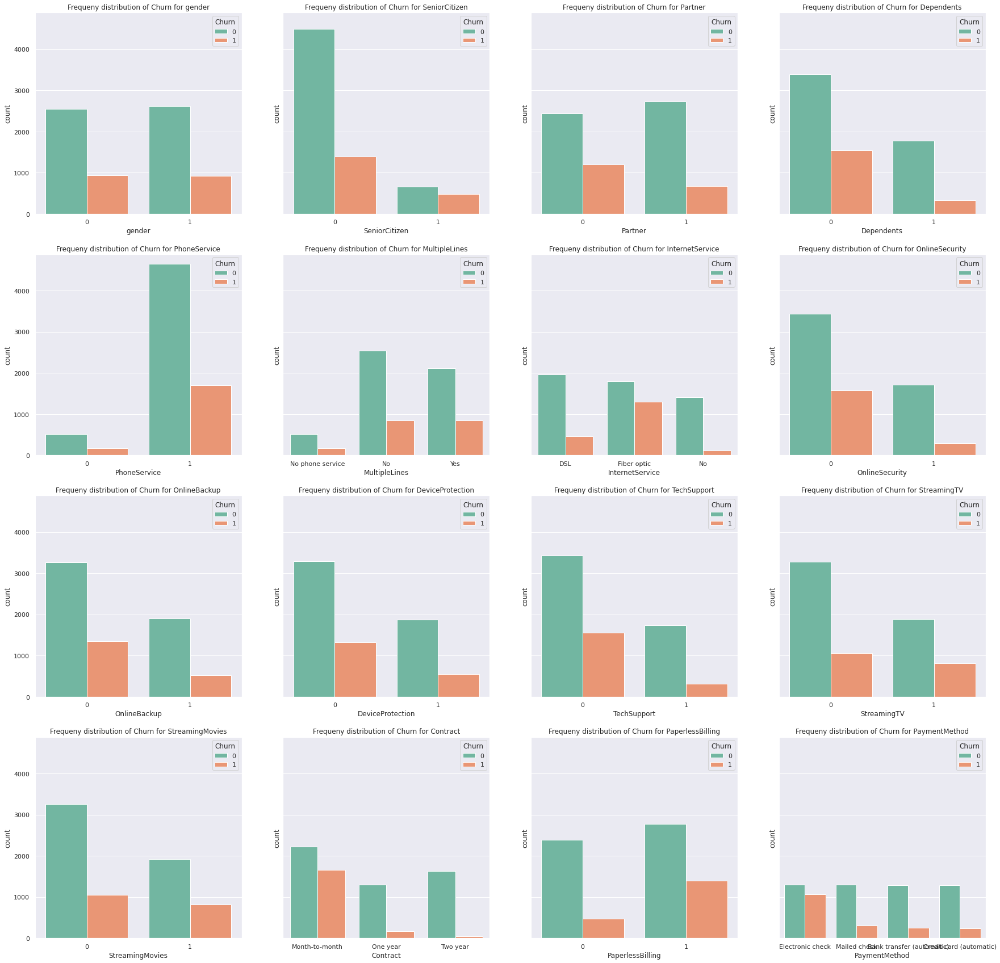

In [19]:
# MultiPlot - target var: Churn
columns_obj = telco.columns.tolist()
num_var = ['tenure','MonthlyCharges','TotalCharges'] # exempt the numerical variables # (task to do) also need to delete Customer_id
for i in num_var:
    columns_obj.remove(i)

fig, axs = plt.subplots(4, 4, sharex=False, sharey=True, figsize=(30,30))

count_row = 0
count_columns = 0
for column in columns_obj:    
    
    Bar_Plot = sns.countplot(x=column,hue='Churn',data=telco, palette="Set2", ax = axs[count_row][count_columns]).set_title("Frequeny distribution of Churn for " + str(column))
        
   
    count_columns +=1
    
    if count_columns == 4:
        count_row+=1
        count_columns=0

###**Correlation (StatExplore in SAS miner)**

Checking correlation between variables, drawing correlation matrix using Spearman's Rank Correlation.




##### Spearman correlation matrix for continuous variables: Total Charges, Tenure, Montly Charges

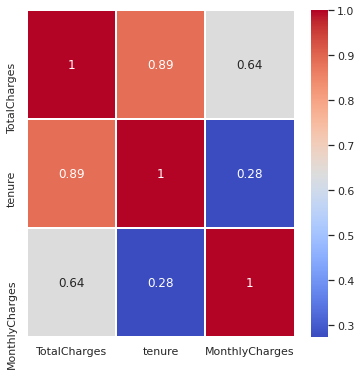

In [20]:
cont_var = telco[["TotalCharges", "tenure", "MonthlyCharges"]]
corr = cont_var.corr(method = 'spearman') #correlation matrix for float and int 

corr_map = plt.figure(figsize=(6,6))
our_map = sns.heatmap (corr, xticklabels = corr.columns, cmap='coolwarm', yticklabels = corr.columns, linewidths =.75, annot = True)

As for continuous variablels, let's take a closer look at them.

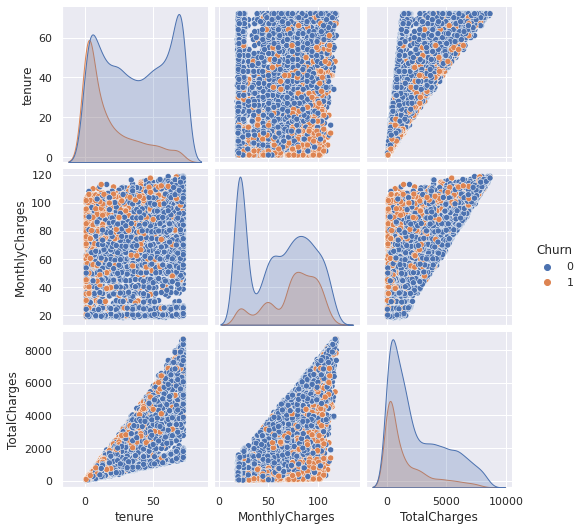

In [21]:
sns.pairplot(telco,vars = ['tenure','MonthlyCharges','TotalCharges'], hue="Churn")

People having lower tenure and higher monthly charges are tend to churn more.



#### Cramers V correlation matrix for categorical variables

In [22]:
columns_all =[]
for column in telco.columns:
  if telco[column].nunique() <5:
    columns_all.append(column)

In [23]:
import scipy.stats as ss

df_corr = telco[columns_all]
# Cramers V for categorical correlations
def cramers_v(x, y):
    x = np.array(x)
    y = np.array(y)
    confusion_matrix = pd.crosstab(x, y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

cramersv = pd.DataFrame(index=df_corr.columns,columns=df_corr.columns)
columns = df_corr.columns

for i in range(0,len(columns)):
    for j in range(0,len(columns)):
        #print(data[columns[i]].tolist())
        u = cramers_v(df_corr[columns[i]].tolist(),df_corr[columns[j]].tolist())
        cramersv.loc[columns[i],columns[j]] = u
        
cramersv.fillna(value=np.nan,inplace=True)

In [24]:
churn_only = cramersv[['Churn']]
new_churn = churn_only.sort_values(by=['Churn'])


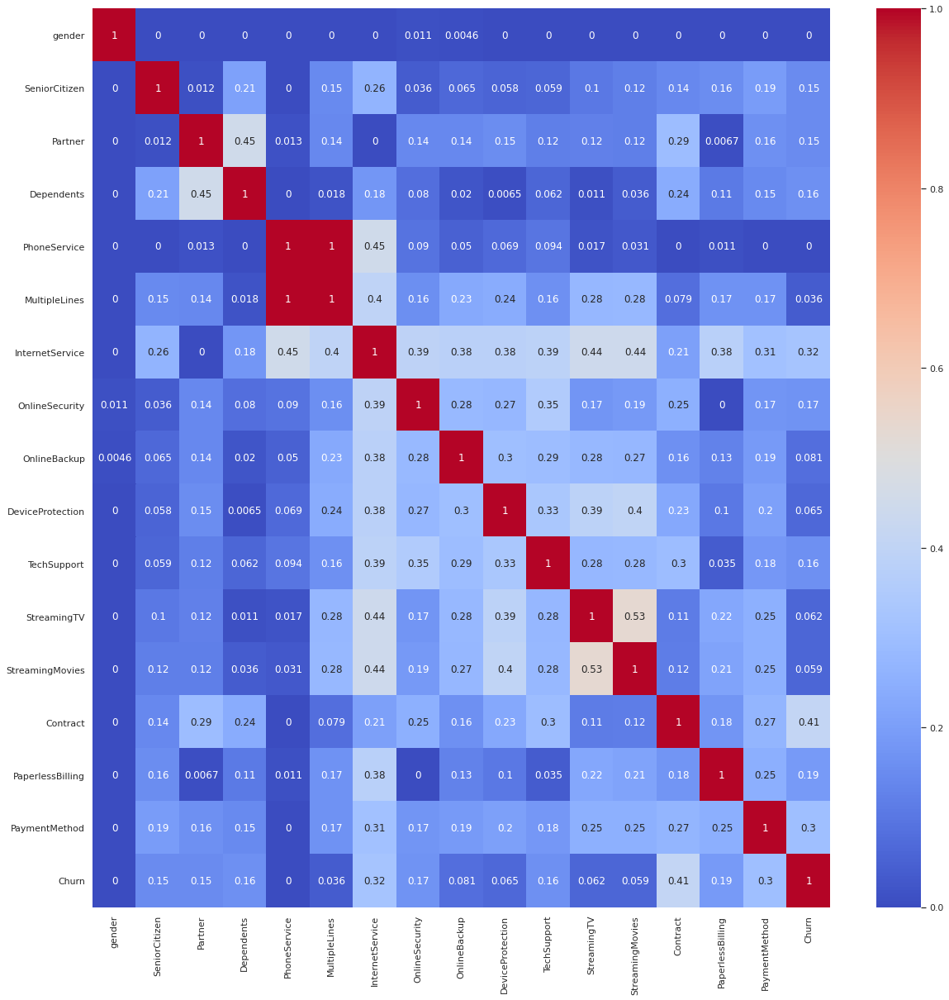

In [25]:
plt.figure(figsize=(20,20))
ax = sns.heatmap(cramersv,cmap="coolwarm", annot = True )
plt.show()




Checking the highest correlation with our target variable as code

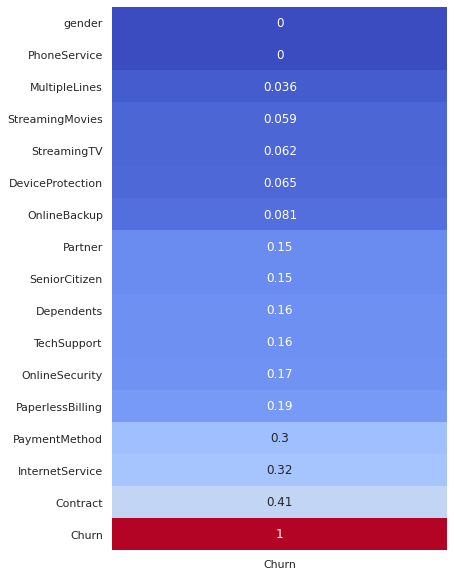

In [26]:
plt.figure(figsize=(6,10))
sns.heatmap(new_churn, cmap="coolwarm", annot=True, cbar = False)

**Findings:**

1) Total Charges and Tenure are highly correlated (0.89). \
→ Considering that TotalCharges can be derived from tenure*Monthly Charges, we can just drop the Total Charges.  


2) Streaming TV, Streaming Movies services are quite correlated between each other (0.53)  \
→ Considering the EDA results, the distribution of values (1/0 and also churn distribution) of Streaming TV and Movies were almost same. So, we decided to assemble those two and make it into one variable 'Streaming Services'.


3) PhoneService and Multiple lines are very correlated between each other (correlation = 1) \
→ We will drop PhoneService (Bcz it's less correlated with our Target Variable Churn than the Multiple lines). 

4) Contract is 41% correlated with Churn. We should take it into consideration and investigate in later steps.  

In [27]:
# Drop some variables based on the result of Correlation matrix
telco_new = telco_new.drop(['TotalCharges', 'PhoneService'], axis=1)

In [28]:
# Create new column 'Streaming' 
telco_new.loc[(telco_new['StreamingTV'] + telco_new['StreamingMovies']) >= 1,'Streaming'] = 1
telco_new['Streaming'].fillna(0, inplace=True)

In [29]:
telco_new = telco_new.drop(['StreamingTV', 'StreamingMovies'], axis=1)

In [30]:
# Data type revision
telco_new["Streaming"] = telco_new["Streaming"].astype(int)
telco_new.dtypes

gender                                       int64
SeniorCitizen                                int64
Partner                                      int64
Dependents                                   int64
tenure                                       int64
OnlineSecurity                               int64
OnlineBackup                                 int64
DeviceProtection                             int64
TechSupport                                  int64
PaperlessBilling                             int64
MonthlyCharges                             float64
Churn                                        int64
MultipleLines_No                             uint8
MultipleLines_No phone service               uint8
MultipleLines_Yes                            uint8
InternetService_DSL                          uint8
InternetService_Fiber optic                  uint8
InternetService_No                           uint8
Contract_Month-to-month                      uint8
Contract_One year              

In [31]:
# Do our data partitioning one more time with new dataset
# 1) Data Partitioning (70/30) - In default way of using sklearn (X-only independent variables, y-our target variables)
# Since our dataset is relatively small, we didn't split it into 3 sets (train, validation, test)
# Instead, we will use K-fold Cross validation later.

from sklearn.model_selection import train_test_split

X = telco_new.drop('Churn', axis=1) 
y = telco_new['Churn']

# Train - Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y, random_state = 42)

X_train_shape = X_train.shape
X_test_shape = X_test.shape
print("X_train shape = {}\nX_test shape = {}".format(X_train_shape, X_test_shape))


X_train shape = (4922, 25)
X_test shape = (2110, 25)


### **Variable Selection**

 Based on the test results we can eliminate those variables which are not strongly associated with the response variable. Alternatively, we can also check the association of independent variables among themselves and can drop those variables which are strongly associated with each other.

The Chi-square test of Independence determines whether there is an association between two categorical variables i.e. whether the variables are independent or related like for example if education level and marital status are related for all people in some country.

 

Variable selection part.

The null hypothesis (H0) and alternative hypothesis (H1) of the **Chi-Square test of Independence** can be expressed like below

H0: “[Churn] is independent of [Variable]”

H1: “[Churn] is not independent of [Variable]”

We are using **α = 0.05,** that would be 95% confidence interval. Based on above heat map we can conclude following inference





#### **Method 1> Univariate Statistical Tests**
**(Chi-squared Test of Independence)**

We can use many different statistical test like Chi-square, ANOVA F-value test for this Univariate Selection method. Among them, we will use chisquare method using chi2() function from sckitlearn.


In [32]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
import plotly.offline as py
import plotly.figure_factory as ff

# fit model with k=14
test = SelectKBest(score_func=chi2, k = 14)
fit = test.fit(X_train, y_train)

# create result dataframe
score = pd.DataFrame({"Variable": X_train.columns, "Score": fit.scores_, "p_value": fit.pvalues_ })
score = score.sort_values(by = "Score", ascending=False)

table_score = ff.create_table(score)
py.iplot(table_score)

In [33]:
# if we want to only leave the best 14 variables
X_best_new = test.fit_transform(X_train, y_train)

mask = fit.get_support() #list of booleans for selected features
new_feat = [] 
for bool, feature in zip(mask, X_train.columns):
 if bool:
   new_feat.append(feature)
print('The best features are:{}'.format(new_feat)) # The list of your 10 best features
print('Original number of features:', X_train.shape)
print('Reduced number of features:', X_best_new.shape)

The best features are:['SeniorCitizen', 'Dependents', 'tenure', 'OnlineSecurity', 'TechSupport', 'PaperlessBilling', 'MonthlyCharges', 'InternetService_Fiber optic', 'InternetService_No', 'Contract_Month-to-month', 'Contract_One year', 'Contract_Two year', 'PaymentMethod_Credit card (automatic)', 'PaymentMethod_Electronic check']
Original number of features: (4922, 25)
Reduced number of features: (4922, 14)


In [34]:
# Create new dataset considering this Variable Selection
selected_features = pd.DataFrame(test.inverse_transform(X_best_new), 
                                 index=X_train.index, 
                                 columns=X_train.columns)

# Dropped columns with values of all 0s, so var is 0, drop them
selected_columns = selected_features.columns[selected_features.var() != 0]

In [35]:
selected_columns

Index(['SeniorCitizen', 'Dependents', 'tenure', 'OnlineSecurity',
       'TechSupport', 'PaperlessBilling', 'MonthlyCharges',
       'InternetService_Fiber optic', 'InternetService_No',
       'Contract_Month-to-month', 'Contract_One year', 'Contract_Two year',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check'],
      dtype='object')

In [36]:
# Create new dataframe with selected variables
X_train_selected = X_train[selected_columns]
X_test_selected = X_test[selected_columns]

In [37]:
X_train_selected

,SeniorCitizen,Dependents,tenure,OnlineSecurity,TechSupport,PaperlessBilling,MonthlyCharges,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check
4491,0,1,12,1,0,1,78.30,1,0,1,0,0,0,1
1928,0,0,20,0,0,1,19.70,0,1,0,1,0,0,0
4660,0,1,2,1,0,1,61.20,0,0,1,0,0,1,0
5672,1,0,34,0,1,0,64.20,0,0,0,1,0,0,0
3604,0,0,12,0,0,1,100.15,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5153,0,1,23,0,1,0,54.15,0,0,1,0,0,0,1
3445,1,0,65,0,0,1,70.95,1,0,0,1,0,0,0
4128,0,1,36,1,1,1,92.90,0,0,0,0,1,1,0
4242,0,1,10,0,0,1,65.90,0,0,0,1,0,0,0


#### **Method 2> Feature Importance Method (using RandomForestClassifier)** 

As we use decision trees (random forest), we can select variables based on high importance.

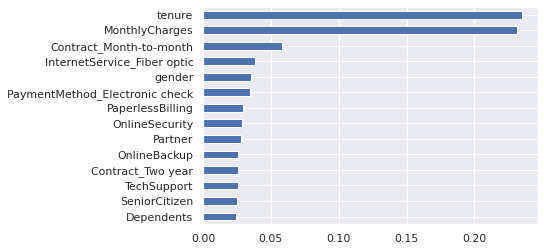

tenure                            0.234934
MonthlyCharges                    0.231490
Contract_Month-to-month           0.058019
InternetService_Fiber optic       0.038271
gender                            0.035333
PaymentMethod_Electronic check    0.034348
PaperlessBilling                  0.029539
OnlineSecurity                    0.028840
Partner                           0.028339
OnlineBackup                      0.026027
Contract_Two year                 0.025628
TechSupport                       0.025580
SeniorCitizen                     0.025053
Dependents                        0.024290
dtype: float64


In [38]:
# Feature importance is inbuilt with Tree Based Classifiers
from sklearn.ensemble import RandomForestClassifier
np.random.seed(42)

# We already made splited X (independent X columns) and y (target column) in Data Partitioning Step, so we will use them.
# instantiate RandomForestClassifier
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
feat_importances = pd.Series(rf_model.feature_importances_, index=X.columns)

# determine 14 most important features
df_imp_feat = feat_importances.nlargest(14)

# plot 14 most important features
df_imp_feat.plot(kind='barh').invert_yaxis()
plt.show()
print(df_imp_feat)

#### **Method 3> Feature Correlation Method** 



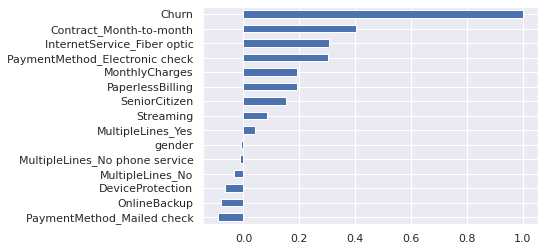

Churn                             1.000000
Contract_Month-to-month           0.404565
InternetService_Fiber optic       0.307463
PaymentMethod_Electronic check    0.301455
MonthlyCharges                    0.192858
PaperlessBilling                  0.191454
SeniorCitizen                     0.150541
Streaming                         0.085040
MultipleLines_Yes                 0.040033
gender                           -0.008545
MultipleLines_No phone service   -0.011691
MultipleLines_No                 -0.032654
DeviceProtection                 -0.066193
OnlineBackup                     -0.082307
PaymentMethod_Mailed check       -0.090773
Name: Churn, dtype: float64


In [39]:
# determine 14 most correlated features
telco_new_corr_churn = telco_new.corr()['Churn'].sort_values(ascending=False).head(15)
top_corr_features = telco_new_corr_churn.index
# plot top 14 most correlated features to our target (Churn)
telco_new_corr_churn.plot(kind='barh').invert_yaxis()
plt.show()
# export selected features to .csv
# telco_new_corr_churn.to_csv('feature_selection_CORRELATION.csv')
print(telco_new_corr_churn)

Above method 3 result tells us that Variables such as Month-to-Month, using Internet Service with 'Fiber optic' and Electronic check payment method looks like positively correlated with our target 'Churn'. On the other hand, the variables such as Device Protection, not using Multuiple Lines or phone service show negatively correlated with Churn, which means they have less correlation with our target.

###**Feature Scaling - using Standardization**

Before we proceed the Clustering, it's necessary to do a feature scaling for the numerical(continuous) variables in our dataset since each numeric variable has different standard of measure. There are several methods to proceed Feature Scaling such as normalization, standardization, etc. Among them, we will do Standardization using StandardScaler function. It makes each numerical feature to have mean '0', std '1' while keeping the shape of the data.

In [40]:
#Feature Scaling for continuous(num) variables before Clustering

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(X_train_selected[['tenure','MonthlyCharges']])
X_train_selected[['tenure','MonthlyCharges']] = sc.transform(
    X_train_selected[['tenure','MonthlyCharges']])

X_train_selected[['tenure','MonthlyCharges']].describe()

,tenure,MonthlyCharges
count,4.922000e+03,4.922000e+03
mean,1.689470e-16,1.707966e-16
std,1.000102e+00,1.000102e+00
min,-1.280909e+00,-1.535103e+00
25%,-9.554981e-01,-9.794060e-01
50%,-1.419706e-01,1.885914e-01
75%,9.562914e-01,8.331178e-01
max,1.607113e+00,1.776770e+00


In [41]:
# sc.fit(X_test_selected[['tenure','MonthlyCharges','TotalCharges']]) 
# since we already fit with our train data, test dataset doesn't need to fit again.
X_test_selected[['tenure','MonthlyCharges']] = sc.transform(X_test_selected[['tenure','MonthlyCharges']])

###**Variable Clustering**

To follow Clustering method operated in SAS, we will use VarClusHi module  in python to perform variable clustering with keeping a hierarchical structure. Through using this, we are expecting to reduce our dimension by selecting 'Best Variables' based on R-square with Own Cluster Component and R-squared ratio.

In [ ]:
!pip install varclushi

In [42]:
from varclushi import VarClusHi

In [43]:
#or should I use only X_train set as input?
cluster_result = VarClusHi(X_train_selected, maxeigval2 = 0.7, maxclus = None)
cluster_result.varclus()

In [44]:
# Number of Clusters, Number of Variables in each Cluster(N_vars), variance explained by each cluster (Eigval1), etc.
cluster_result.info

,Cluster,N_Vars,Eigval1,Eigval2,VarProp
0,0,3,2.231318,0.435094,0.743773
1,1,3,2.359791,0.530191,0.786597
2,2,1,1.000000,0.000000,1.000000
3,3,2,1.377281,0.622719,0.688641
4,4,2,1.346628,0.653372,0.673314
5,5,1,1.000000,0.000000,1.000000
6,6,1,1.000000,0.000000,1.000000
7,7,1,1.000000,0.000000,1.000000


In [45]:
# R-square ratio of variables in the clusters 
# (R-Square with Own Cluster Component, R-Square with next cluster component, 1-RSquared Ratio)
cluster_result.rsquare.sort_values(by=["Cluster", "RS_Ratio"], ascending = (True, True))

,Cluster,Variable,RS_Own,RS_NC,RS_Ratio
2,0,Contract_Two year,0.715169,0.084011,0.310955
0,0,tenure,0.733741,0.149956,0.313230
1,0,Contract_Month-to-month,0.782408,0.315929,0.318083
3,1,MonthlyCharges,0.933246,0.159253,0.079399
4,1,InternetService_Fiber optic,0.725741,0.103221,0.305826
5,1,InternetService_No,0.700804,0.168584,0.359863
6,2,Contract_One year,1.000000,0.035789,0.000000
7,3,PaymentMethod_Credit card (automatic),0.688641,0.058729,0.330786
8,3,PaymentMethod_Electronic check,0.688641,0.106583,0.348504
9,4,OnlineSecurity,0.673314,0.083676,0.356518


In [46]:
# From this result, we will only select the best variables from each cluster
X_train_clus_selected = X_train_selected[['Contract_Two year', 'MonthlyCharges', 'Contract_One year', 'PaymentMethod_Credit card (automatic)',
        'OnlineSecurity', 'Dependents', 'SeniorCitizen', 'PaperlessBilling']]

In [47]:
X_test_clus_selected = X_test_selected[['Contract_Two year', 'MonthlyCharges', 'Contract_One year', 'PaymentMethod_Credit card (automatic)',
        'OnlineSecurity', 'Dependents', 'SeniorCitizen', 'PaperlessBilling']]

In [48]:
X_train_clus_selected.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4922 entries, 4491 to 272
Data columns (total 8 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Contract_Two year                      4922 non-null   uint8  
 1   MonthlyCharges                         4922 non-null   float64
 2   Contract_One year                      4922 non-null   uint8  
 3   PaymentMethod_Credit card (automatic)  4922 non-null   uint8  
 4   OnlineSecurity                         4922 non-null   int64  
 5   Dependents                             4922 non-null   int64  
 6   SeniorCitizen                          4922 non-null   int64  
 7   PaperlessBilling                       4922 non-null   int64  
dtypes: float64(1), int64(4), uint8(3)
memory usage: 245.1 KB


In [49]:
X_test_clus_selected.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2110 entries, 4214 to 4443
Data columns (total 8 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Contract_Two year                      2110 non-null   uint8  
 1   MonthlyCharges                         2110 non-null   float64
 2   Contract_One year                      2110 non-null   uint8  
 3   PaymentMethod_Credit card (automatic)  2110 non-null   uint8  
 4   OnlineSecurity                         2110 non-null   int64  
 5   Dependents                             2110 non-null   int64  
 6   SeniorCitizen                          2110 non-null   int64  
 7   PaperlessBilling                       2110 non-null   int64  
dtypes: float64(1), int64(4), uint8(3)
memory usage: 105.1 KB


##**Step 3. Modify**

1. Grouping the similar/highly correlated variables considering distribution
2. Grouping Tenure variable into 3 groups 

##**Step 4. Model**

####**Logistic Regression**
We will build 3 different Logistic Regression Model: 

1) Model with full range of variables

2) Model with Selected Variables

*   2-1) Model with Selected variables using RFE (recursive feature elimination) 
*   2-2) Model with Selected variables from Previous Explore Step (Univariate selection with Chi-square test + Variable Clustering)


 
 


In [ ]:
# !pip uninstall scikit-learn -y
!pip install -U scikit-learn

##### **1) Logistic Regression Modelling with Full Variables**

In [50]:
# Feature Scaling (standardization) for our original train, test data (even before variable selection)
# Feature Scaling is also essential for machinelearning algorithms to have proper insight and interpretation from the result.

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(X_train[['tenure','MonthlyCharges']])
X_train[['tenure','MonthlyCharges']] = sc.transform(X_train[['tenure','MonthlyCharges']])

X_train.describe()
sc.fit(X_test[['tenure','MonthlyCharges']])
X_test[['tenure','MonthlyCharges']] = sc.transform(X_test[['tenure','MonthlyCharges']])

In [51]:
from sklearn.linear_model import LogisticRegression

lr_model = LogisticRegression(C = 1e6, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e6 for not doing a regularization
lr_model.fit(X_train, y_train)
lr_y_pred = lr_model.predict(X_test)
lr_y_pred_train = lr_model.predict(X_train)

Text(0.5, 257.44, 'Predicted label')

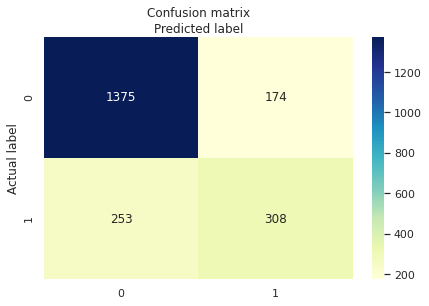

In [52]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr_y_pred)

# Visualization of Confusion Matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [53]:
print("R²=", lr_model.score(X_train, y_train))
print("intercept = ", lr_model.intercept_)

R²= 0.8043478260869565
intercept =  [-0.45617296]


In this step we are printing all coefficient of each variable.

In [54]:
for f, w in zip(X_train.columns, lr_model.coef_[0]):
  print(f"{f:<30} {w}")

gender                         -0.003887226023649472
SeniorCitizen                  0.17426541119628577
Partner                        0.02625832190142786
Dependents                     -0.27803741256783887
tenure                         -0.8185071273573669
OnlineSecurity                 -0.620135010859756
OnlineBackup                   -0.3460156016660788
DeviceProtection               -0.1659018193285574
TechSupport                    -0.6146811852227139
PaperlessBilling               0.3311141199033048
MonthlyCharges                 1.2661057645017693
MultipleLines_No               -0.648640943973582
MultipleLines_No phone service 0.6705891316466306
MultipleLines_Yes              -0.4781208354799567
InternetService_DSL            -0.12920180089356625
InternetService_Fiber optic    -0.2719857219252443
InternetService_No             -0.05498512498809607
Contract_Month-to-month        0.5121477824803687
Contract_One year              -0.1817219977982476
Contract_Two year              -

To sum up the result of the logistic regression we import necessary additions from sklearn to add confusion matrix evaluation metrics. We will further use it for model comparison.

In [55]:
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr_y_pred, y_test)
train_acc = metrics.accuracy_score(lr_y_pred_train, y_train)
prec = metrics.precision_score(lr_y_pred, y_test)
rec = metrics.recall_score(lr_y_pred, y_test)
f1 = f1_score(lr_y_pred, y_test)

results = pd.DataFrame([['Logistic Regression (Base Model)', test_acc, train_acc, prec, rec, f1]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Logistic Regression (Base Model),0.79763,0.804348,0.54902,0.639004,0.590604


In [56]:
from sklearn.metrics import classification_report
print(classification_report(lr_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.89      0.84      0.87      1628
           1       0.55      0.64      0.59       482

    accuracy                           0.80      2110
   macro avg       0.72      0.74      0.73      2110
weighted avg       0.81      0.80      0.80      2110



As we can see the model does a good job with prediction having 80% accuracy.

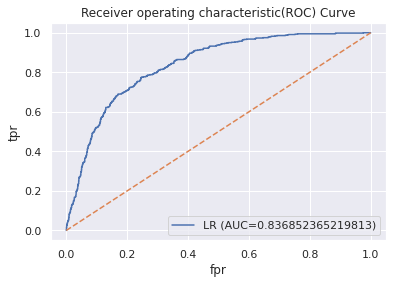

AUC score for test data: 0.836852365219813
AUC score for train data: 0.8492289795545357


In [57]:
# ROC Curve
lr_predictions_proba = lr_model.predict_proba(X_test)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr_predictions_proba)

auc = metrics.roc_auc_score(y_test, lr_predictions_proba) 

plt.plot(fpr,tpr,label="LR (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.83 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train = lr_model.predict_proba(X_train)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_log_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [58]:
# !pip install scikit-plot # <- if required

In [59]:
# pip install delayed  # <- if required

<Figure size 504x504 with 0 Axes>

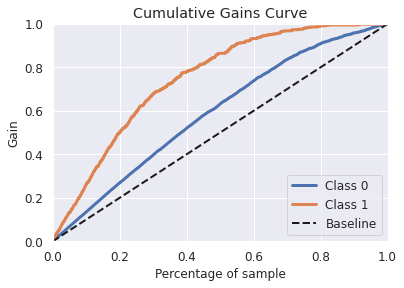

In [60]:
import scikitplot as skplt

pred1 = lr_model.predict_proba(X_test)
# pred2 = model2.predict_proba(test_x)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred1)
plt.show()

**[For interpretation] Detailed summary of Logistic Regression full model result**

In [61]:
import statsmodels.api as sm
glm = sm.GLM(y_train, X_train, family = sm.families.Binomial()).fit()
glm.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 4922
Model:                            GLM   Df Residuals:                     4900
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2028.6
Date:                Fri, 11 Jun 2021   Deviance:                       4057.2
Time:                        12:15:55   Pearson chi2:                 5.09e+03
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
gender                                     -0.0039      0.078     -0.050      0.960      -0.157       0.149
SeniorCitizen                               0.1743      0.102      1.709      0.087      -0.026       0.374
Partner                                     0.0263      0.093      0.282      0.778      -0.156       0.209
Dependents                                 -0.2781      0.108     -2.585      0.010      -0.489      -0.067
tenure                                     -0.8185      0.070    -11.699      0.000      -0.956      -0.681
OnlineSecurity                             -0.6201      0.114     -5.456      0.000      -0.843      -0.397
OnlineBackup                               -0.3460      0.105     -3.309      0.001      -0.551      -0.141
DeviceProtection                           -0.1659      0.114     -1.449      0.147      -0.390       0.058
TechSupport                                -0.6147      0.117     -5.275      0.000      -0.843      -0.386
PaperlessBilling                            0.3311      0.089      3.705      0.000       0.156       0.506
MonthlyCharges                              1.2661      0.326      3.881      0.000       0.627       1.905
MultipleLines_No                           -0.7703      0.069    -11.187      0.000      -0.905      -0.635
MultipleLines_No phone service              0.5489      0.255      2.152      0.031       0.049       1.049
MultipleLines_Yes                          -0.5997      0.084     -7.099      0.000      -0.765      -0.434
InternetService_DSL                        -0.2508      0.110     -2.288      0.022      -0.466      -0.036
InternetService_Fiber optic                -0.3936      0.221     -1.783      0.075      -0.826       0.039
InternetService_No                         -0.1766      0.354     -0.499      0.618      -0.871       0.518
Contract_Month-to-month                     0.3905      0.113      3.460      0.001       0.169       0.612
Contract_One year                          -0.3034      0.117     -2.597      0.009      -0.532      -0.074
Contract_Two year                          -0.9082      0.157     -5.773      0.000      -1.217      -0.600
PaymentMethod_Bank transfer (automatic)    -0.3399      0.102     -3.325      0.001      -0.540      -0.140
PaymentMethod_Credit card (automatic)      -0.3194      0.103     -3.105      0.002      -0.521      -0.118
PaymentMethod_Electronic check              0.0304      0.084      0.363      0.717      -0.134       0.195
PaymentMethod_Mailed check                 -0.1923      0.099     -1.946      0.052      -0.386       0.001
Streaming                                  -0.2931      0.179     -1.634      0.102      -0.645       0.058
===========================================================

In [62]:
# Odds Ratio
np.exp(glm.params)

gender                                     0.996114
SeniorCitizen                              1.190358
Partner                                    1.026600
Dependents                                 0.757258
tenure                                     0.441094
OnlineSecurity                             0.537874
OnlineBackup                               0.707501
DeviceProtection                           0.847123
TechSupport                                0.540811
PaperlessBilling                           1.392510
MonthlyCharges                             3.546958
MultipleLines_No                           0.462884
MultipleLines_No phone service             1.731416
MultipleLines_Yes                          0.548953
InternetService_DSL                        0.778155
InternetService_Fiber optic                0.674610
InternetService_No                         0.838089
Contract_Month-to-month                    1.477708
Contract_One year                          0.738324
Contract_Two

Droping(rejecting) the variables with p-value >0.05 and re-do LR model fitting

In [63]:
# Variable filtering based on p-value
X_train_new = X_train.drop(['gender', 'SeniorCitizen', 'Partner', 'DeviceProtection', 'InternetService_Fiber optic',
                            'InternetService_No', 'PaymentMethod_Electronic check', 
                            'PaymentMethod_Mailed check', 'Streaming'], axis=1)
X_test_new = X_test.drop(['gender', 'SeniorCitizen', 'Partner', 'DeviceProtection', 'InternetService_Fiber optic',
                            'InternetService_No', 'PaymentMethod_Electronic check', 
                            'PaymentMethod_Mailed check', 'Streaming'], axis=1)

R²= 0.802519301097115
intercept =  [-0.67890116]


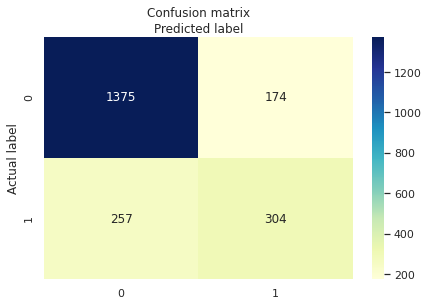

In [64]:
from sklearn.linear_model import LogisticRegression

lr_model = LogisticRegression(C = 1e6, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e6 for not doing a regularization
lr_model.fit(X_train_new, y_train)
lr_y_pred = lr_model.predict(X_test_new)
lr_y_pred_train = lr_model.predict(X_train_new)

from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr_y_pred)

# Visualization of Confusion Matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print("R²=", lr_model.score(X_train_new, y_train))
print("intercept = ", lr_model.intercept_)

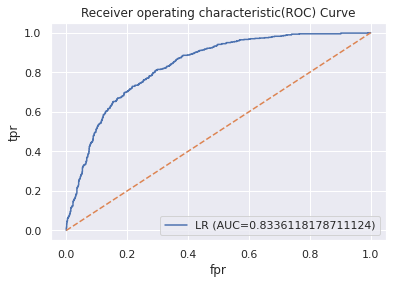

AUC score for test data: 0.8336118178711124
AUC score for train data: 0.8478843953771352


In [65]:
# ROC Curve
lr_predictions_proba = lr_model.predict_proba(X_test_new)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr_predictions_proba)

auc = metrics.roc_auc_score(y_test, lr_predictions_proba) 

plt.plot(fpr,tpr,label="LR (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.83 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train = lr_model.predict_proba(X_train_new)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_log_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")

In [66]:
from sklearn.metrics import classification_report
print(classification_report(lr_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.89      0.84      0.86      1632
           1       0.54      0.64      0.59       478

    accuracy                           0.80      2110
   macro avg       0.71      0.74      0.72      2110
weighted avg       0.81      0.80      0.80      2110



In [67]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr_y_pred, y_test)
train_acc = metrics.accuracy_score(lr_y_pred_train, y_train)
prec = metrics.precision_score(lr_y_pred, y_test)
rec = metrics.recall_score(lr_y_pred, y_test)
f1 = f1_score(lr_y_pred, y_test)

results0 = pd.DataFrame([['Logistic Regression (var select with p-value)', test_acc, train_acc, prec, rec, f1]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results0

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Logistic Regression (var select with p-value),0.795735,0.802519,0.541889,0.635983,0.585178


In [68]:
import statsmodels.api as sm
glm = sm.GLM(y_train, X_train_new, family = sm.families.Binomial()).fit()
glm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 4922
Model:                            GLM   Df Residuals:                     4907
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2035.8
Date:                Fri, 11 Jun 2021   Deviance:                       4071.7
Time:                        12:16:12   Pearson chi2:                 5.16e+03
No. Iterations:                    11                                         
Covariance Type:            nonrobust                                         
===========================================================================================================
                                              coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------
Dependents                                 -0.3089      0.097     -3.196      0.001      -0.498      -0.119
tenure                                     -0.8218      0.067    -12.292      0.000      -0.953      -0.691
OnlineSecurity                             -0.5860      0.102     -5.746      0.000      -0.786      -0.386
OnlineBackup                               -0.3036      0.093     -3.273      0.001      -0.485      -0.122
TechSupport                                -0.6201      0.103     -6.007      0.000      -0.822      -0.418
PaperlessBilling                            0.3581      0.089      4.037      0.000       0.184       0.532
MonthlyCharges                              1.0504      0.069     15.320      0.000       0.916       1.185
MultipleLines_No                           -1.0368      0.076    -13.671      0.000      -1.185      -0.888
MultipleLines_No phone service              0.1508      0.142      1.061      0.289      -0.128       0.430
MultipleLines_Yes                          -0.8120      0.083     -9.806      0.000      -0.974      -0.650
InternetService_DSL                        -0.0295      0.110     -0.269      0.788      -0.244       0.185
Contract_Month-to-month                     0.1550      0.081      1.918      0.055      -0.003       0.313
Contract_One year                          -0.6129      0.107     -5.740      0.000      -0.822      -0.404
Contract_Two year                          -1.2401      0.162     -7.671      0.000      -1.557      -0.923
PaymentMethod_Bank transfer (automatic)    -0.3166      0.110     -2.868      0.004      -0.533      -0.100
PaymentMethod_Credit card (automatic)      -0.2913      0.112     -2.605      0.009      -0.511      -0.072
===========================================================================================================
"""

In [69]:
# Odds Ratio
np.exp(glm.params)

Dependents                                 0.734261
tenure                                     0.439619
OnlineSecurity                             0.556533
OnlineBackup                               0.738135
TechSupport                                0.537910
PaperlessBilling                           1.430568
MonthlyCharges                             2.858770
MultipleLines_No                           0.354577
MultipleLines_No phone service             1.162792
MultipleLines_Yes                          0.443986
InternetService_DSL                        0.970951
Contract_Month-to-month                    1.167639
Contract_One year                          0.541781
Contract_Two year                          0.289368
PaymentMethod_Bank transfer (automatic)    0.728596
PaymentMethod_Credit card (automatic)      0.747256
dtype: float64

##### **2) Logistic Regression Modelling with Selected Variables**

In Python, we don't have option for Stepwise selection but only Forward or Backward selection for variable selection (ex. Sequential Feature Selector from sci-kit learn). So, instead of just using ordinary fw, bw method, we decided to use the RFE which means recursive feature eliminiation. This one is very similar to Backward regression, but still a bit more advanced in that this approach does the whole cycle of eliminations and then chooses the best subset of it while ordinary Backward method stops at the point where the score starts decreasing. 

Recursive feature elimination is based on the idea to repeatedly construct a model (for example an SVM or a regression model) and choose either the best or worst performing feature (for example based on coefficients), setting the feature aside and then repeating the process with the rest of the features. This process is applied until all features in the dataset are exhausted. Features are then ranked according to when they were eliminated. As such, it is a greedy optimization for finding the best performing subset of features.

###### **2-1) Variable Selection using RFE (recursive feature elimination)**

In [70]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
from sklearn.feature_selection import RFE

# Feature extraction
lr2_model = LogisticRegression(solver='lbfgs', max_iter=15000)
rfe = RFE(lr2_model, n_features_to_select=None) #None means just half of the features are selected
fit = rfe.fit(X_train, y_train)
print("Num Features: %s" % (fit.n_features_))
print("Selected Features: %s" % (fit.support_))
print("Feature Ranking: %s" % (fit.ranking_))

Num Features: 12
Selected Features: [False False False  True  True  True  True False  True  True  True  True
  True False False False False  True False  True False False  True False
 False]
Feature Ranking: [14  4 10  1  1  1  1  5  1  1  1  1  1  2 12 11  8  1  9  1  6  7  1 13
  3]


In [71]:
selected_features_rfe = list(fit.support_)
final_features_rfe = []    
for status, var in zip(selected_features_rfe, X_train.columns):
    if status == True:
        final_features_rfe.append(var)
        
final_features_rfe

['Dependents',
 'tenure',
 'OnlineSecurity',
 'OnlineBackup',
 'TechSupport',
 'PaperlessBilling',
 'MonthlyCharges',
 'MultipleLines_No',
 'MultipleLines_No phone service',
 'Contract_Month-to-month',
 'Contract_Two year',
 'PaymentMethod_Electronic check']

In [72]:
X_train_rfe = X_train[['Dependents', 'tenure', 'OnlineSecurity', 'OnlineBackup',
 'TechSupport', 'PaperlessBilling', 'MonthlyCharges', 'MultipleLines_No',
 'MultipleLines_No phone service', 'Contract_Month-to-month', 'Contract_Two year',
 'PaymentMethod_Electronic check']]

In [73]:
X_test_rfe = X_test[['Dependents', 'tenure', 'OnlineSecurity', 'OnlineBackup',
 'TechSupport', 'PaperlessBilling', 'MonthlyCharges', 'MultipleLines_No',
 'MultipleLines_No phone service', 'Contract_Month-to-month', 'Contract_Two year',
 'PaymentMethod_Electronic check']]

Above table shows that RFE filtered variables well because p-value of all features is < 0.05

In [74]:
# Logistic Regression Model with selected features from RFE

lr2_model = LogisticRegression(C = 1e6, solver='lbfgs', max_iter=15000, random_state = 42) # add C = 1e6 for not doing a regularization

lr2_model.fit(X_train_rfe, y_train)
lr2_y_pred = lr2_model.predict(X_test_rfe)
lr2_y_pred_train = lr2_model.predict(X_train_rfe)

In [75]:
print("R²=", lr2_model.score(X_train_rfe, y_train))
print("intercept = ", lr2_model.intercept_)

R²= 0.8021129622104836
intercept =  [-1.65641602]


In [76]:
# Print coefficient of each variable
for f, w in zip(X_train_rfe.columns, lr2_model.coef_[0]):
  print(f"{f:<30} {w}")

Dependents                     -0.3058120179496669
tenure                         -0.8376110069963331
OnlineSecurity                 -0.5731696659607886
OnlineBackup                   -0.29975781020159736
TechSupport                    -0.599595297226053
PaperlessBilling               0.33628944922260734
MonthlyCharges                 0.9956711050743535
MultipleLines_No               -0.2208123265507876
MultipleLines_No phone service 0.8917774431361019
Contract_Month-to-month        0.7472631712030877
Contract_Two year              -0.619103449046536
PaymentMethod_Electronic check 0.330398481870257


Text(0.5, 257.44, 'Predicted label')

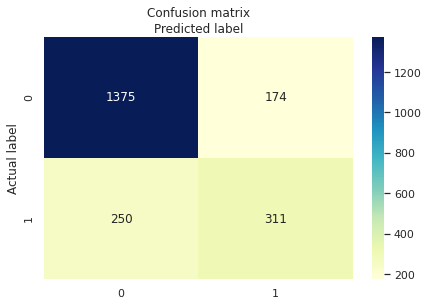

In [77]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr2_y_pred)

# Visualization of Confusion Matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [78]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr2_y_pred, y_test)
train_acc = metrics.accuracy_score(lr2_y_pred_train, y_train)
prec = metrics.precision_score(lr2_y_pred, y_test)
rec = metrics.recall_score(lr2_y_pred, y_test)
f1 = f1_score(lr2_y_pred, y_test)

results2 = pd.DataFrame([['Logistic Regression (selected var with RFE)', test_acc, train_acc, prec, rec, f1]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results2

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Logistic Regression (selected var with RFE),0.799052,0.802113,0.554367,0.641237,0.594646


In [79]:
from sklearn.metrics import classification_report
print(classification_report(lr2_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.89      0.85      0.87      1625
           1       0.55      0.64      0.59       485

    accuracy                           0.80      2110
   macro avg       0.72      0.74      0.73      2110
weighted avg       0.81      0.80      0.80      2110



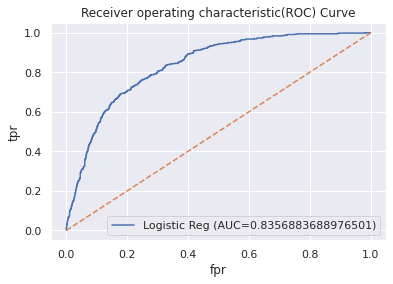

AUC score for test data: 0.8356883688976501
AUC score for train data: 0.8481345481130974


In [80]:
# ROC Curve
lr2_predictions_proba = lr2_model.predict_proba(X_test_rfe)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr2_predictions_proba)

auc2 = metrics.roc_auc_score(y_test, lr2_predictions_proba) 

plt.plot(fpr,tpr,label="Logistic Reg (AUC="+str(auc2)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.84 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train_2 = lr2_model.predict_proba(X_train_rfe)[:, 1]
auc2_train = metrics.roc_auc_score(y_train, y_proba_log_train_2)

print(f"AUC score for test data: {auc2}")
print(f"AUC score for train data: {auc2_train}")

<Figure size 504x504 with 0 Axes>

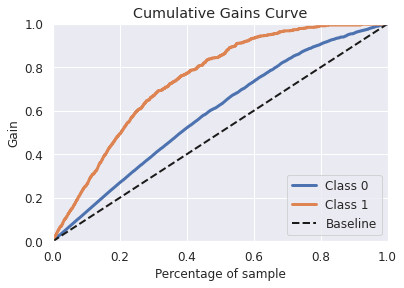

In [81]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred_lr2 = lr2_model.predict_proba(X_test_rfe)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred_lr2)
plt.show()

In [82]:
import statsmodels.api as sm
glm2 = sm.GLM(y_train, X_train_rfe, family = sm.families.Binomial()).fit()
glm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 4922
Model:                            GLM   Df Residuals:                     4910
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2105.8
Date:                Fri, 11 Jun 2021   Deviance:                       4211.7
Time:                        12:17:09   Pearson chi2:                 5.09e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Dependents                        -0.5606      0.092     -6.062      0.000      -0.742      -0.379
tenure                            -0.9348      0.065    -14.446      0.000      -1.062      -0.808
OnlineSecurity                    -0.8350      0.097     -8.651      0.000      -1.024      -0.646
OnlineBackup                      -0.5420      0.089     -6.100      0.000      -0.716      -0.368
TechSupport                       -0.8529      0.098     -8.737      0.000      -1.044      -0.662
PaperlessBilling                  -0.0661      0.080     -0.826      0.409      -0.223       0.091
MonthlyCharges                     1.0401      0.063     16.432      0.000       0.916       1.164
MultipleLines_No                  -0.6603      0.088     -7.496      0.000      -0.833      -0.488
MultipleLines_No phone service     0.5482      0.159      3.451      0.001       0.237       0.860
Contract_Month-to-month           -0.1447      0.092     -1.578      0.115      -0.325       0.035
Contract_Two year                 -1.3701      0.185     -7.392      0.000      -1.733      -1.007
PaymentMethod_Electronic check     0.1459      0.082      1.786      0.074      -0.014       0.306
==================================================================================================
"""

In [83]:
# Odds Ratio
np.exp(glm2.params)

Dependents                        0.570861
tenure                            0.392652
OnlineSecurity                    0.433876
OnlineBackup                      0.581599
TechSupport                       0.426159
PaperlessBilling                  0.936048
MonthlyCharges                    2.829472
MultipleLines_No                  0.516676
MultipleLines_No phone service    1.730216
Contract_Month-to-month           0.865252
Contract_Two year                 0.254073
PaymentMethod_Electronic check    1.157077
dtype: float64

###### **2-2) LR Model with Variable Selection with Univariate + Clustering**

In [84]:
from sklearn.linear_model import LogisticRegression

lr3_model = LogisticRegression(solver='lbfgs', max_iter=1000)
lr3_model.fit(X_train_clus_selected, y_train)
lr3_y_pred = lr3_model.predict(X_test_clus_selected)
lr3_y_pred_train = lr3_model.predict(X_train_clus_selected)

In [85]:
print("R²=", lr3_model.score(X_train_clus_selected, y_train))
print("intercept = ", lr3_model.intercept_)

R²= 0.7761072734660707
intercept =  [-0.38957516]


Text(0.5, 257.44, 'Predicted label')

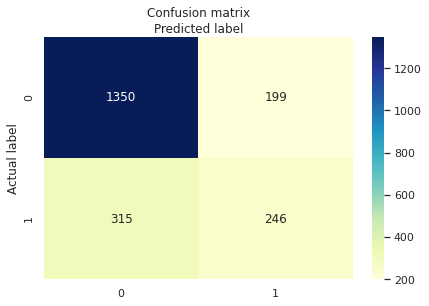

In [86]:
from sklearn import metrics
# Model Evaluation using Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, lr3_y_pred)

# Visualization of Confusion Matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [87]:
# Confusion Matrix Evaluation Metrics
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score, confusion_matrix

test_acc = metrics.accuracy_score(lr3_y_pred, y_test)
train_acc = metrics.accuracy_score(lr3_y_pred_train, y_train)
prec = metrics.precision_score(lr3_y_pred, y_test)
rec = metrics.recall_score(lr3_y_pred, y_test)
f1 = f1_score(lr3_y_pred, y_test)

results3 = pd.DataFrame([['Logistic Regression (Univariate+Clustering)', test_acc, train_acc, prec, rec, f1]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results3


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Logistic Regression (Univariate+Clustering),0.756398,0.776107,0.438503,0.552809,0.489066


In [88]:
from sklearn.metrics import classification_report
print(classification_report(lr3_y_pred, y_test))

              precision    recall  f1-score   support

           0       0.87      0.81      0.84      1665
           1       0.44      0.55      0.49       445

    accuracy                           0.76      2110
   macro avg       0.66      0.68      0.66      2110
weighted avg       0.78      0.76      0.77      2110



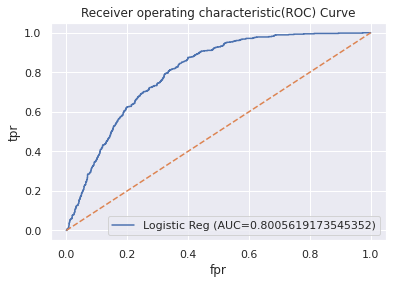

AUC score for test data: 0.8005619173545352
AUC score for train data: 0.818174500625329


In [89]:
# ROC Curve
lr3_predictions_proba = lr3_model.predict_proba(X_test_clus_selected)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, lr3_predictions_proba)

auc3 = metrics.roc_auc_score(y_test, lr3_predictions_proba) 

plt.plot(fpr,tpr,label="Logistic Reg (AUC="+str(auc3)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.80 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_log_train_3 = lr3_model.predict_proba(X_train_clus_selected)[:, 1]
auc3_train = metrics.roc_auc_score(y_train, y_proba_log_train_3)

print(f"AUC score for test data: {auc3}")
print(f"AUC score for train data: {auc3_train}")

<Figure size 504x504 with 0 Axes>

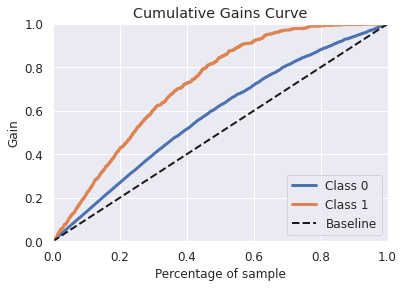

In [90]:
pred_lr3 = lr3_model.predict_proba(X_test_clus_selected)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred_lr3)
plt.show()


Text(0.5, 0, 'False Positive Rate')

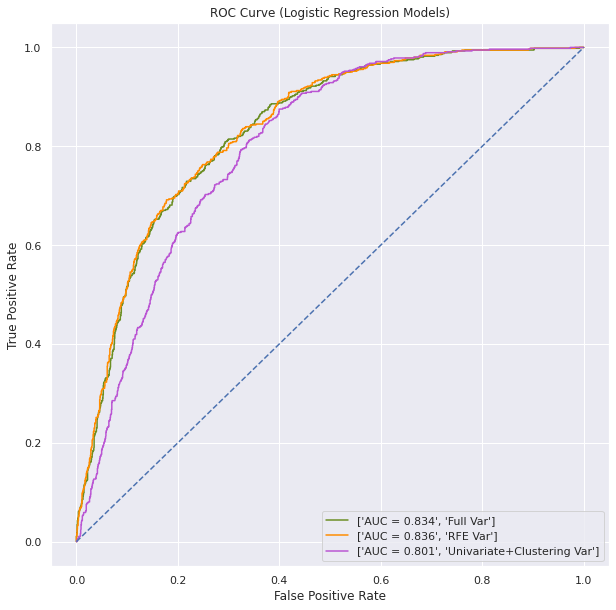

In [91]:
# LR ROC Curve Summary
fpr, tpr, thresholds = metrics.roc_curve(y_test, lr_predictions_proba) # Full model
fpr1, tpr1, thresholds = metrics.roc_curve(y_test, lr2_predictions_proba) # variable selected RFE model
fpr2, tpr2, thresholds = metrics.roc_curve(y_test, lr3_predictions_proba) # variable selected model

auc = metrics.roc_auc_score(y_test, lr_predictions_proba)
auc2 = metrics.roc_auc_score(y_test, lr2_predictions_proba)  
auc3 = metrics.roc_auc_score(y_test, lr3_predictions_proba) 

import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('ROC Curve (Logistic Regression Models)')
plt.plot(fpr,tpr, color='olivedrab',label = ['AUC = %0.3f' % auc,'Full Var'])
plt.plot(fpr1,tpr1, color='darkorange',label = ['AUC = %0.3f' % auc2,'RFE Var'])
plt.plot(fpr2,tpr2, color='mediumorchid',label = ['AUC = %0.3f' % auc3,'Univariate+Clustering Var'])

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

####**Decision Tree**

We will build 3 different DECISION TREES:

1) Model with full range of variables

2) Model with Selected Variables

2-1) Model with Selected variables using RFE (recursive feature elimination)

2-2) Model with Selected variables from Previous Explore Step (Univariate selection with Chi-square test + Variable Clustering)

##### 1) Model with full range of variables

1) all variables included => hard to interpret!


In [92]:
import pandas as pd
from sklearn import tree
import pydotplus
from sklearn.tree import DecisionTreeClassifier #Decision Tree Classifier is imported
from sklearn import metrics

In [ ]:
# in case if u didn't run the previous LR, and only run DT model part, need to run this scaling again

# Feature Scaling (standardization) for our original train, test data (even before variable selection)
# Feature Scaling is also essential for machinelearning algorithms to have proper insight and interpretation from the result.

# from sklearn.preprocessing import StandardScaler
# sc = StandardScaler()
# sc.fit(X_train[['tenure','MonthlyCharges']])
# X_train[['tenure','MonthlyCharges']] = sc.transform(X_train[['tenure','MonthlyCharges']])

# X_train.describe()
# sc.fit(X_test[['tenure','MonthlyCharges']])
# X_test[['tenure','MonthlyCharges']] = sc.transform(X_test[['tenure','MonthlyCharges']])

              precision    recall  f1-score   support

           0       0.81      0.80      0.81      1549
           1       0.48      0.49      0.48       561

    accuracy                           0.72      2110
   macro avg       0.64      0.65      0.65      2110
weighted avg       0.72      0.72      0.72      2110



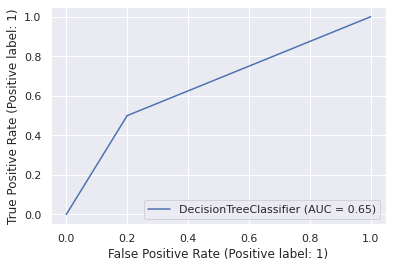

In [93]:
#Create Decision Tree classifier object 
clf = DecisionTreeClassifier()

#Train Decision Tree Classifier

clf = clf.fit(X_train, y_train)

# Predict the response for test set
Churn_train = clf.predict(X_train)
Churn_predict = clf.predict(X_test)

#Plotting report and ROC
print(classification_report(y_test,Churn_predict))
metrics.plot_roc_curve(clf, X_test, y_test)

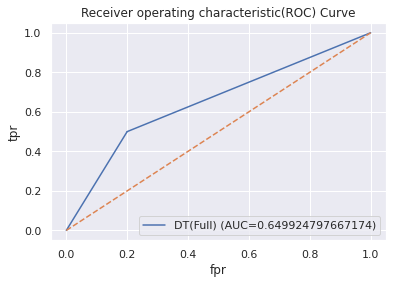

AUC score for test data: 0.649924797667174
AUC score for train data: 0.9999927016749338


In [94]:
# new version
dt_predictions_proba = clf.predict_proba(X_test)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, dt_predictions_proba)
auc = metrics.roc_auc_score(y_test, dt_predictions_proba) 

plt.plot(fpr,tpr,label="DT(Full) (AUC="+str(auc)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.83 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_dt_train = clf.predict_proba(X_train)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_dt_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")


<Figure size 504x504 with 0 Axes>

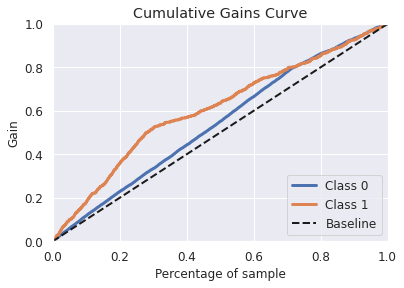

In [95]:
import scikitplot as skplt

pred1 = clf.predict_proba(X_test)
# pred2 = model2.predict_proba(test_x)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred1)
plt.show()

Checked importance of variables based on Deicison Tree Classifier

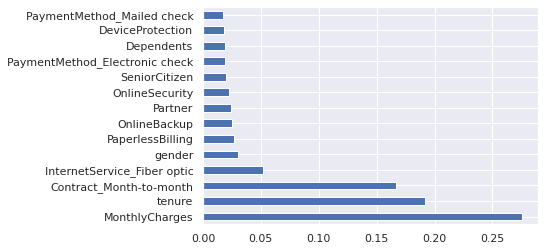

MonthlyCharges                    0.275384
tenure                            0.191686
Contract_Month-to-month           0.166519
InternetService_Fiber optic       0.051896
gender                            0.029958
PaperlessBilling                  0.026964
OnlineBackup                      0.024813
Partner                           0.024321
OnlineSecurity                    0.022408
SeniorCitizen                     0.019993
PaymentMethod_Electronic check    0.019350
Dependents                        0.019224
DeviceProtection                  0.018066
PaymentMethod_Mailed check        0.017727
dtype: float64


In [96]:
feat_importances_tree = pd.Series(clf.feature_importances_, index=X_train.columns)

# determine 14 most important features
df_imp_feat_tree = feat_importances_tree.nlargest(14)

# plot 14 most important features
df_imp_feat_tree.plot(kind='barh')
plt.show()
print(df_imp_feat_tree)

Accuracy can be computed by comparing actual test set values and predicted values

Text(0.5, 257.44, 'Predicted label')

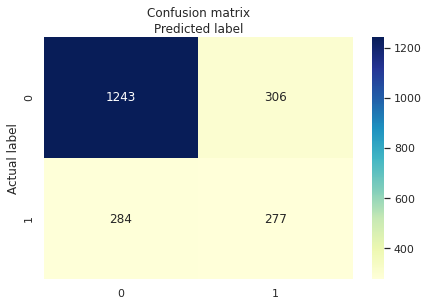

In [97]:
cnf_matrix_tree_all = metrics.confusion_matrix(y_test, Churn_predict)

# Visualization of Confusion Matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix_tree_all), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [98]:
print("Accuracy:", metrics.accuracy_score(y_test, Churn_predict))

Accuracy: 0.7203791469194313


In [99]:
# Confusion Matrix Evaluation Metrics
# Churn_train = clf.predict(X_train)
# Churn_predict = clf.predict(X_test)

test_acc = metrics.accuracy_score(Churn_predict, y_test)
train_acc = metrics.accuracy_score(Churn_train, y_train)
prec = metrics.precision_score(Churn_predict, y_test)
rec = metrics.recall_score(Churn_predict, y_test)
f1 = f1_score(Churn_predict, y_test)

results_DT1 = pd.DataFrame([['Decision Tree (Base Model: full set of variables)', test_acc, train_acc, prec, rec, f1]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results_DT1


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Decision Tree (Base Model: full set of variables),0.720379,0.998375,0.493761,0.475129,0.484266


A classification rate of 71.8%, considered as good accuracy. We can improve this accuracy by tuning the parameters in the Decision Tree Algorithm.

In [ ]:
pip install graphviz #if required 

In [ ]:
pip install pydotplus #if required

In [100]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

In the decision tree chart, each internal node has a decision rule that splits the data. Gini referred as Gini ratio, which measures the impurity of the node. You can say a node is pure when all of its records belong to the same class, such nodes known as the leaf node.

Here, the resultant tree is unpruned. This unpruned tree is unexplainable and not easy to understand. In the next section, let's optimize it by pruning.

In [101]:
dot_data = StringIO()
features = X_train.columns
export_graphviz(clf, out_file = dot_data,
                filled = True, rounded = True, special_characters = True, feature_names = features, class_names = ['0', '1'] )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('tree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.4861 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.4861 to fit



We need to get rid of unimportant variables. Let's do prunning, check the model accurace and see what variables are important.

##### **2) Pruning our Decision tree**

In [102]:
clf_prun = DecisionTreeClassifier(criterion = "gini", max_depth=3)
#entropy = Information Gain
#can change to gini - explanation of differences -> link ------->
clf_prun = clf_prun.fit(X_train, y_train)

Churn_predict_prun = clf_prun.predict(X_test)
Churn_predict_clf_train = clf_prun.predict(X_train)

print("Accuracy:", metrics.accuracy_score(y_test, Churn_predict_prun))

Accuracy: 0.7848341232227488


In [103]:
# Confusion Matrix Evaluation Metrics
# Churn_train = clf_prub.predict(X_train)
# Churn_predict_prun = clf_prun.predict(X_test)

test_acc = metrics.accuracy_score(Churn_predict_prun, y_test)
train_acc = metrics.accuracy_score(Churn_predict_clf_train, y_train)
prec = metrics.precision_score(Churn_predict_prun, y_test)
rec = metrics.recall_score(Churn_predict_prun, y_test)
f1 = f1_score(Churn_predict_prun, y_test)

results_DT2 = pd.DataFrame([['Decision Tree (Prunned model using Gini criterion)', test_acc, train_acc, prec, rec, f1]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results_DT2


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Decision Tree (Prunned model using Gini criter...,0.784834,0.792158,0.356506,0.682594,0.468384


The classification rate increased  to 78.48%, which is better accuracy than the previous model. 

              precision    recall  f1-score   support

           0       0.80      0.94      0.87      1549
           1       0.68      0.36      0.47       561

    accuracy                           0.78      2110
   macro avg       0.74      0.65      0.67      2110
weighted avg       0.77      0.78      0.76      2110



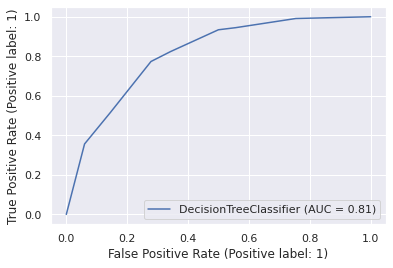

In [104]:
print(classification_report(y_test,Churn_predict_prun))
metrics.plot_roc_curve(clf_prun, X_test, y_test)

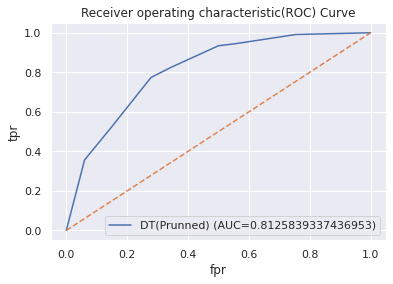

AUC score for test data: 0.8125839337436953
AUC score for train data: 0.8264480511568162


In [105]:
# new version
dt2_predictions_proba = clf_prun.predict_proba(X_test)[:,1]
fpr2, tpr2, threshold = metrics.roc_curve(y_test, dt2_predictions_proba)
auc2 = metrics.roc_auc_score(y_test, dt2_predictions_proba) 

plt.plot(fpr2,tpr2,label="DT(Prunned) (AUC="+str(auc2)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()

# AUC Score for the case is 0.83 (If AUC score is closer to 1, it means perfect classifier, and closer to 0.5 means a worthless classifier)
y_proba_dt_train = clf_prun.predict_proba(X_train)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_dt_train)

print(f"AUC score for test data: {auc2}")
print(f"AUC score for train data: {auc_train}")


<Figure size 504x504 with 0 Axes>

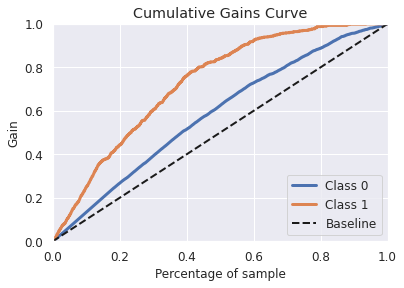

In [106]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred2 = clf_prun.predict_proba(X_test)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred2)
plt.show()

Cumulative Gaains Curve, according to it, if we approach 40% of our customer base (x-axis), we will get over almost 80% pf people who will leave the company(class 1).

Importantce of prunned tree variables

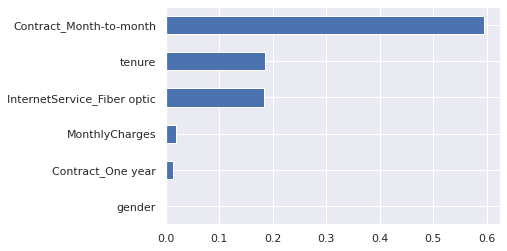

Contract_Month-to-month        0.596014
tenure                         0.185333
InternetService_Fiber optic    0.183877
MonthlyCharges                 0.020078
Contract_One year              0.014697
gender                         0.000000
dtype: float64


In [107]:
feat_importances_prun_tree = pd.Series(clf_prun.feature_importances_, index=X_train.columns)

# determine most important features
df_imp_feat_prun_tree = feat_importances_prun_tree.nlargest(6)

# plot most important features
df_imp_feat_prun_tree.plot(kind='barh').invert_yaxis()
plt.show()
print(df_imp_feat_prun_tree)

In [108]:
# pip install graphviz

In [109]:
# Do our data partitioning one more time with new dataset (After correlation)
# 1) Data Partitioning (70/30)

from sklearn.model_selection import train_test_split

X = telco_new.drop('Churn', axis=1) 
y = telco_new['Churn']

# Train - Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y, random_state = 42)

X_train_shape = X_train.shape
X_test_shape = X_test.shape
print("X_train shape = {}\nX_test shape = {}".format(X_train_shape, X_test_shape))

X_train shape = (4922, 25)
X_test shape = (2110, 25)


In [110]:
from io import StringIO

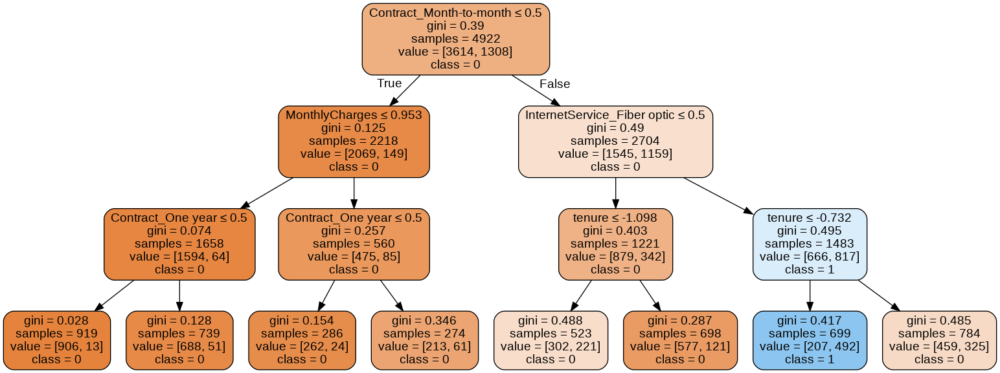

In [111]:
dot_data1 = StringIO()
features = X.columns
export_graphviz(clf_prun, out_file = dot_data1,
                filled = True, rounded = True, special_characters = True, feature_names = features, class_names = ['0', '1'] )
graph = pydotplus.graph_from_dot_data(dot_data1.getvalue())
graph.write_png('tree.png')

Image(graph.create_png())

Contract_month-to-month <= 0.5 means that the customer with a contract value of less than 0.5 will follow the arrow to the left (which means everyone without monthly contract), and the rest will follow the arrow to the right.

Gini = 0.38 refers to a quality of split. it's always a number between 0.0 annd 0.5, where 0.0 would mean all of the samples got the same result, and 0.5 would mean that the split is done exactly in the middle.

Sample means that there are 4922 customers left at this point in the decision, which is all of them since this is the first step.

Value [3614, 1308]  means that of those customers, 36134 will get a churn as "NO" = 0, and 1308 will get a "YES" = 1.

Another way to look st decision tree

In [ ]:
pip install dtreeviz

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


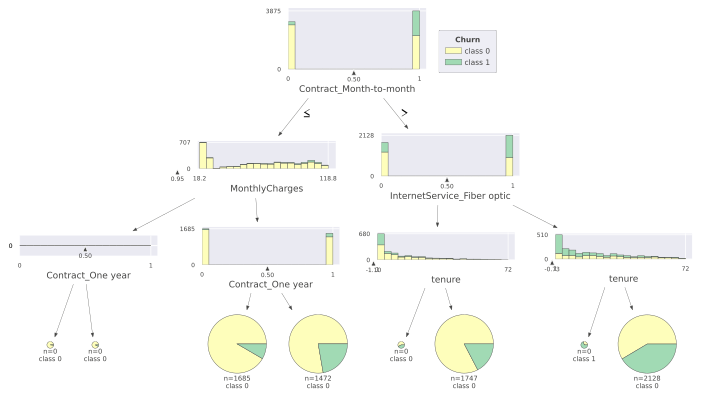

In [112]:
from dtreeviz.trees import dtreeviz 

viz = dtreeviz(clf_prun, X, y,
                target_name="Churn", feature_names=X.columns)

viz

##### 3) Model with Selected Variables

Model with Selected variables from Previous Explore Step (Univariate selection with Chi-square test + Variable Clustering)

**Var selected from Univariate Chi + Var Clustered**

              precision    recall  f1-score   support

           0       0.80      0.82      0.81      1549
           1       0.47      0.44      0.45       561

    accuracy                           0.72      2110
   macro avg       0.64      0.63      0.63      2110
weighted avg       0.71      0.72      0.72      2110



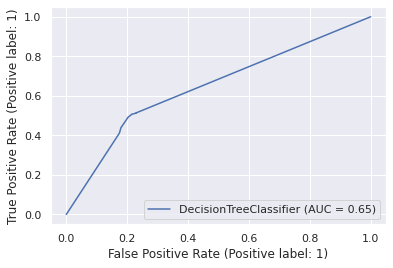

In [113]:
#X_train_clus_selected

#Create Decision Tree classifier object

clf_clus = DecisionTreeClassifier()
#Train Decision Tree Classifier

clf_clus = clf_clus.fit(X_train_clus_selected, y_train)

# Predict the response for test set
Churn_predict_clus = clf_clus.predict(X_test_clus_selected)
Churn_train_clus = clf_clus.predict(X_train_clus_selected)

#Plotting report and ROC
print(classification_report(y_test,Churn_predict_clus))
metrics.plot_roc_curve(clf_clus, X_test_clus_selected, y_test)

In [114]:
print("Accuracy Chi+Clustered :", metrics.accuracy_score(y_test, Churn_predict_clus))

Accuracy Chi+Clustered : 0.718957345971564


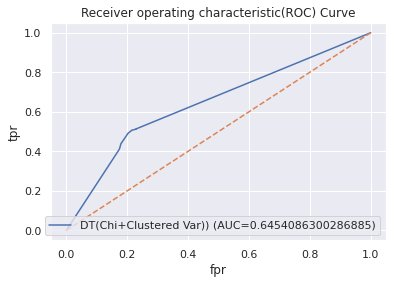

AUC score for test data: 0.6454086300286885
AUC score for train data: 0.9955885327024196


In [115]:
# new version ROC
dt3_predictions_proba = clf_clus.predict_proba(X_test_clus_selected)[:,1]
fpr3, tpr3, threshold = metrics.roc_curve(y_test, dt3_predictions_proba)
auc3 = metrics.roc_auc_score(y_test, dt3_predictions_proba) 

plt.plot(fpr3,tpr3,label="DT(Chi+Clustered Var)) (AUC="+str(auc3)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()


y_proba_dt_train = clf_clus.predict_proba(X_train_clus_selected)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_dt_train)

print(f"AUC score for test data: {auc3}")
print(f"AUC score for train data: {auc_train}")

In [116]:
# Confusion Matrix Evaluation Metrics
# Churn_predict_clus = clf_clus.predict(X_test_clus_selected)
# Churn_train_clus = clf_clus.predict(X_train_clus_selected)

test_acc = metrics.accuracy_score(Churn_predict_clus, y_test)
train_acc = metrics.accuracy_score(Churn_train_clus, y_train)
prec = metrics.precision_score(Churn_predict_clus, y_test)
rec = metrics.recall_score(Churn_predict_clus, y_test)
f1 = f1_score(Churn_predict_clus, y_test)

results_DT5 = pd.DataFrame([['Decision Tree (Chi+Clustered variables)', test_acc, train_acc, prec, rec, f1]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results_DT5


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Decision Tree (Chi+Clustered variables),0.718957,0.959976,0.438503,0.469466,0.453456


<Figure size 504x504 with 0 Axes>

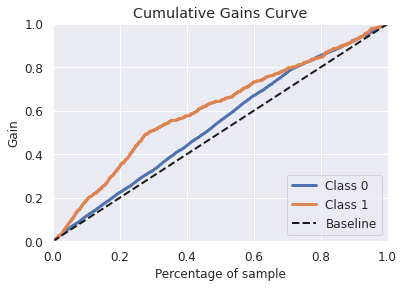

In [117]:

# pred1 = clf.predict_proba(X_test)
pred3 = clf_clus.predict_proba(X_test_clus_selected)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred3)
plt.show()

Text(0.5, 257.44, 'Predicted label')

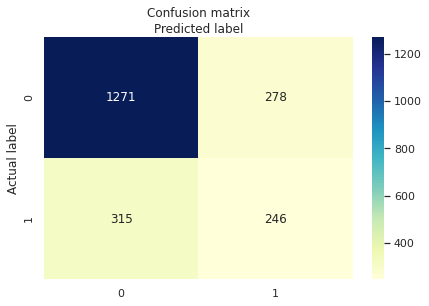

In [118]:
Churn_predict_clus = metrics.confusion_matrix(y_test, Churn_predict_clus)

# Visualization of Confusion Matrix
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(Churn_predict_clus), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

#### XGBoost

Accuracy on Train set 0.7958147094676961
Accuracy on Test set 0.7876777251184834
F1-score on Test set: 0.4909090909090909


              precision    recall  f1-score   support

           0       0.81      0.93      0.87      1549
           1       0.68      0.39      0.49       561

    accuracy                           0.79      2110
   macro avg       0.74      0.66      0.68      2110
weighted avg       0.77      0.79      0.77      2110





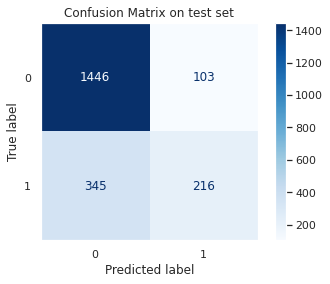

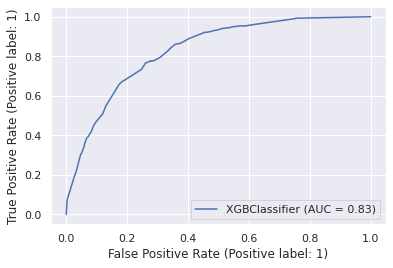

In [119]:
# Xgboost
import xgboost as xgb


# create object model
Xgboost_model = xgb.XGBClassifier(objective = 'binary:logistic', 
                                  learning_rate=0.01,verbosity=1)

# fit the model
Xgboost_model.fit(X_train ,y_train)

# model score
predict_train = Xgboost_model.predict(X_train)
predict_test = Xgboost_model.predict(X_test)

# accuracy score
Xgb_train_score = Xgboost_model.score(X_train,y_train)
Xgb_test_score = Xgboost_model.score(X_test,y_test)

Xgb_f1_score = metrics.f1_score(predict_test, y_test)

print('Accuracy on Train set',Xgb_train_score)
print('Accuracy on Test set',Xgb_test_score)
print('F1-score on Test set:',Xgb_f1_score)
print('\n')
print(metrics.classification_report(y_test,predict_test))
print('\n')

# confusion matrix
metrics.plot_confusion_matrix(Xgboost_model,X_test,y_test,values_format='d',cmap='Blues');
plt.grid(False)
plt.title('Confusion Matrix on test set');


metrics.plot_roc_curve(Xgboost_model, X_test, y_test)

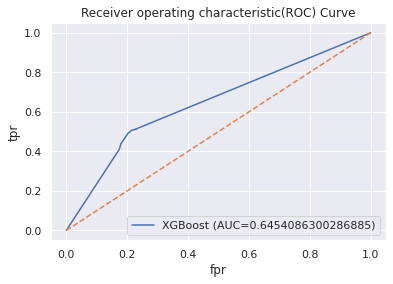

AUC score for test data: 0.8281784924780407
AUC score for train data: 0.8445341468533006


In [120]:
# new version ROC for XGB
xgb_predictions_proba = Xgboost_model.predict_proba(X_test)[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, xgb_predictions_proba)
auc = metrics.roc_auc_score(y_test, xgb_predictions_proba) 

plt.plot(fpr3,tpr3,label="XGBoost (AUC="+str(auc3)+")")
plt.title('Receiver operating characteristic(ROC) Curve')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],linestyle='--')
plt.show()


y_proba_dt_train = Xgboost_model.predict_proba(X_train)[:, 1]
auc_train = metrics.roc_auc_score(y_train, y_proba_dt_train)

print(f"AUC score for test data: {auc}")
print(f"AUC score for train data: {auc_train}")


<Figure size 504x504 with 0 Axes>

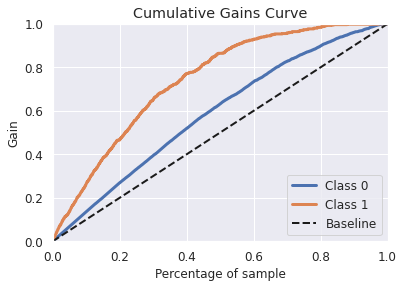

In [121]:
import scikitplot as skplt

# pred1 = clf.predict_proba(X_test)
pred4 = Xgboost_model.predict_proba(X_test)

plt.figure(figsize=(7,7))
skplt.metrics.plot_cumulative_gain(y_test, pred4)
plt.show()

In [122]:
# Confusion Matrix Evaluation Metrics

prec = metrics.precision_score(predict_test, y_test)
rec = metrics.recall_score(predict_test, y_test)
f1 = f1_score(predict_test, y_test)

results_xgb = pd.DataFrame([['XGBoost', Xgb_test_score, Xgb_train_score, prec, rec, Xgb_f1_score]],columns=['Model', 'Test Accuracy', 'Train Accuracy', 
                                                                                                           'Precision', 'Recall', 'F1 Score'])
results_xgb

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,XGBoost,0.787678,0.795815,0.385027,0.677116,0.490909


In [ ]:
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_tree
import matplotlib
import matplotlib.pyplot as plt

	
plot_tree(Xgboost_model, num_trees=3)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 100)
fig.savefig('tree.png')

###**Comparison between LR Models**

In [124]:
lr_results_total = pd.concat([results, results0, results2, results3], ignore_index=True)
lr_results_total

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Logistic Regression (Base Model),0.797630,0.804348,0.549020,0.639004,0.590604
1,Logistic Regression (var select with p-value),0.795735,0.802519,0.541889,0.635983,0.585178
2,Logistic Regression (selected var with RFE),0.799052,0.802113,0.554367,0.641237,0.594646
3,Logistic Regression (Univariate+Clustering),0.756398,0.776107,0.438503,0.552809,0.489066


In conclusion, Logistic Regression model with variable selection using RFE has the highest performance in every perspective (Test Accuracy, Precisions, Recall, F1 Score).

###**Comparison between DT Models**

In [125]:
DT_results_total = pd.concat([results_DT1, results_DT2, results_DT5], ignore_index=True)
DT_results_total

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
0,Decision Tree (Base Model: full set of variables),0.720379,0.998375,0.493761,0.475129,0.484266
1,Decision Tree (Prunned model using Gini criter...,0.784834,0.792158,0.356506,0.682594,0.468384
2,Decision Tree (Chi+Clustered variables),0.718957,0.959976,0.438503,0.469466,0.453456


##**Step 5. Assess**

Model Comparison

In [126]:
# All model Comparison
all_model_results = pd.concat([results_xgb, lr_results_total, DT_results_total], ignore_index=True)
all_model_results.sort_values(by=['Test Accuracy'], ascending=False)

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 Score
3,Logistic Regression (selected var with RFE),0.799052,0.802113,0.554367,0.641237,0.594646
1,Logistic Regression (Base Model),0.797630,0.804348,0.549020,0.639004,0.590604
2,Logistic Regression (var select with p-value),0.795735,0.802519,0.541889,0.635983,0.585178
0,XGBoost,0.787678,0.795815,0.385027,0.677116,0.490909
6,Decision Tree (Prunned model using Gini criter...,0.784834,0.792158,0.356506,0.682594,0.468384
4,Logistic Regression (Univariate+Clustering),0.756398,0.776107,0.438503,0.552809,0.489066
5,Decision Tree (Base Model: full set of variables),0.720379,0.998375,0.493761,0.475129,0.484266
7,Decision Tree (Chi+Clustered variables),0.718957,0.959976,0.438503,0.469466,0.453456


**ROC Plot Comparison**

Text(0.5, 0, 'False Positive Rate (1-Specificity)')

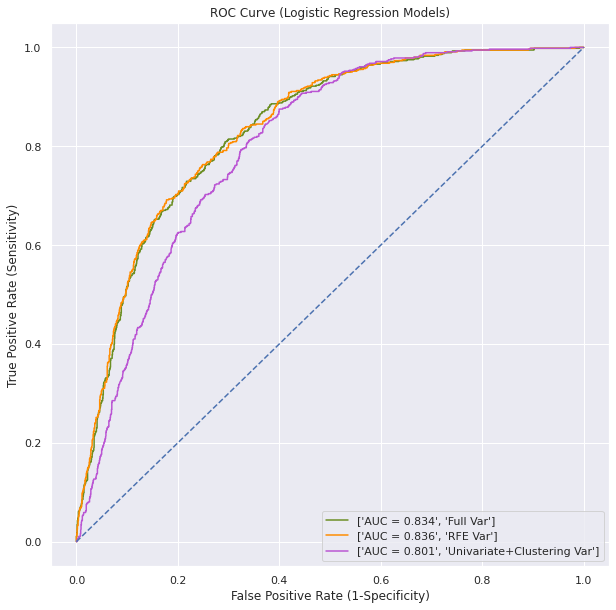

In [127]:
# LR ROC Curve Summary
fpr, tpr, thresholds = metrics.roc_curve(y_test, lr_predictions_proba) # Full model
fpr1, tpr1, thresholds = metrics.roc_curve(y_test, lr2_predictions_proba) # variable selected RFE model
fpr2, tpr2, thresholds = metrics.roc_curve(y_test, lr3_predictions_proba) # variable selected model

auc = metrics.roc_auc_score(y_test, lr_predictions_proba)
auc2 = metrics.roc_auc_score(y_test, lr2_predictions_proba)  
auc3 = metrics.roc_auc_score(y_test, lr3_predictions_proba) 

import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('ROC Curve (Logistic Regression Models)')
plt.plot(fpr,tpr, color='olivedrab',label = ['AUC = %0.3f' % auc,'Full Var'])
plt.plot(fpr1,tpr1, color='darkorange',label = ['AUC = %0.3f' % auc2,'RFE Var'])
plt.plot(fpr2,tpr2, color='mediumorchid',label = ['AUC = %0.3f' % auc3,'Univariate+Clustering Var'])

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')

Text(0.5, 0, 'False Positive Rate (1-Specificity)')

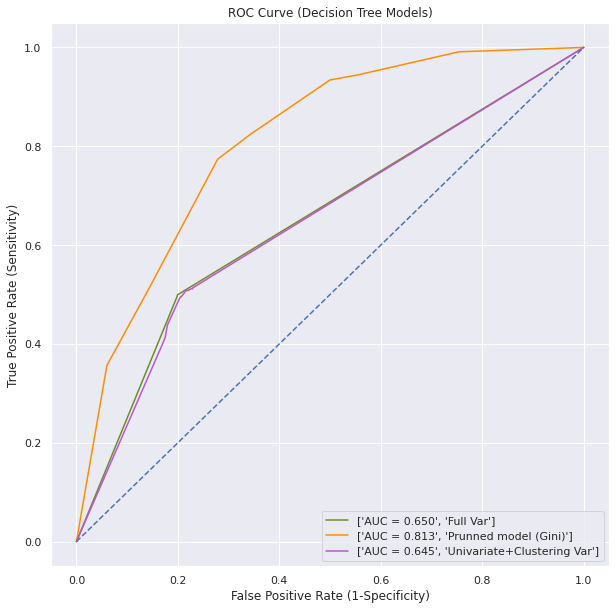

In [128]:
# Decision Tree ROC Curve Summary
fpr_1, tpr_1, threshold = metrics.roc_curve(y_test, dt_predictions_proba) # Full model
fpr_2, tpr_2, threshold = metrics.roc_curve(y_test, dt2_predictions_proba) # Prunned model using Gini criterion
fpr_3, tpr_3, threshold = metrics.roc_curve(y_test, dt3_predictions_proba) # Variable selected model

auc_1 = metrics.roc_auc_score(y_test, dt_predictions_proba) 
auc_2 = metrics.roc_auc_score(y_test, dt2_predictions_proba) 
auc_3 = metrics.roc_auc_score(y_test, dt3_predictions_proba) 

import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('ROC Curve (Decision Tree Models)')
plt.plot(fpr_1,tpr_1, color='olivedrab',label = ['AUC = %0.3f' % auc_1,'Full Var'])
plt.plot(fpr_2,tpr_2, color='darkorange',label = ['AUC = %0.3f' % auc_2,'Prunned model (Gini)'])
plt.plot(fpr_3,tpr_3, color='mediumorchid',label = ['AUC = %0.3f' % auc_3,'Univariate+Clustering Var'])

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')

**All models ROC Curve**

Text(0.5, 0, 'False Positive Rate (1-Specificity)')

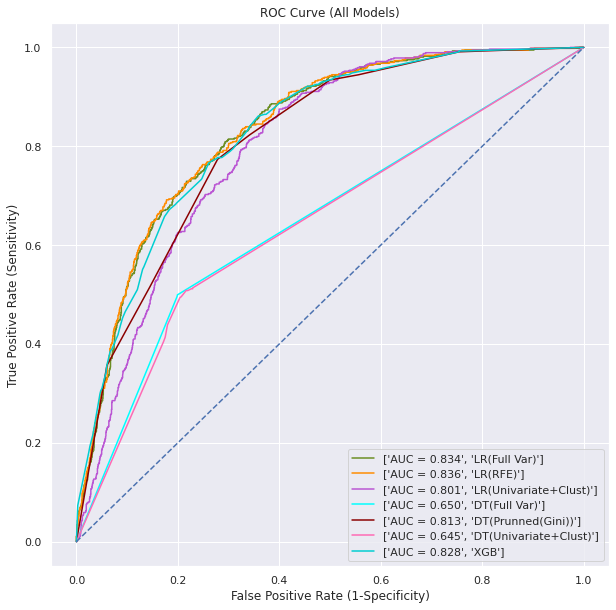

In [129]:
#XGBoost ROC
fpr_4, tpr_4, threshold = metrics.roc_curve(y_test, xgb_predictions_proba)
auc_4 = metrics.roc_auc_score(y_test, xgb_predictions_proba) 

plt.figure(figsize=(10,10))
plt.title('ROC Curve (All Models)')
plt.plot(fpr,tpr, color='olivedrab',label = ['AUC = %0.3f' % auc,'LR(Full Var)'])
plt.plot(fpr1,tpr1, color='darkorange',label = ['AUC = %0.3f' % auc2,'LR(RFE)'])
plt.plot(fpr2,tpr2, color='mediumorchid',label = ['AUC = %0.3f' % auc3,'LR(Univariate+Clust)'])
plt.plot(fpr_1,tpr_1, color='aqua',label = ['AUC = %0.3f' % auc_1,'DT(Full Var)'])
plt.plot(fpr_2,tpr_2, color='darkred',label = ['AUC = %0.3f' % auc_2,'DT(Prunned(Gini))'])
plt.plot(fpr_3,tpr_3, color='hotpink',label = ['AUC = %0.3f' % auc_3,'DT(Univariate+Clust)'])
plt.plot(fpr_4,tpr_4, color='darkturquoise',label = ['AUC = %0.3f' % auc_4,'XGB'])


plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.xlabel('False Positive Rate (1-Specificity)')